In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
#pip install plotly_express == 4.2.0 

### PCA in sklearn

In [3]:
""" from sklearn.decomposition import PCA
pca = PCA(n_components = 2)
X2D = pca.fit_transform(X)
""" 

' from sklearn.decomposition import PCA\npca = PCA(n_components = 2)\nX2D = pca.fit_transform(X)\n'

In [4]:
"""
pca = PCA(n_components= 0.95)
x_reduced = pca.fit_transform(X_train)
"""

'\npca = PCA(n_components= 0.95)\nx_reduced = pca.fit_transform(X_train)\n'

In [5]:
"""
pca = PCA()
pca.fit(X_train)
cumsum = np.cumsum(pca.explained_variance_ratio_)
d = np.argmax(cumsum >= 0.95) + 1 
"""

'\npca = PCA()\npca.fit(X_train)\ncumsum = np.cumsum(pca.explained_variance_ratio_)\nd = np.argmax(cumsum >= 0.95) + 1 \n'

In [6]:
data_import = pd.read_csv("creditcard.csv")
data_import

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0


In [7]:
unused = data_import [["Time", "Amount"]]
y = data_import["Class"]
X = data_import.iloc[: , 1:-2] #all columns except 1st and last 2 columns
X 

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,...,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,...,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,...,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,...,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,4.356170,...,-0.682920,1.475829,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731
284803,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,-0.975926,...,-1.545556,0.059616,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527
284804,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,-0.484782,...,-0.577252,0.001396,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561
284805,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,-0.399126,...,2.897849,0.127434,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533


In [8]:
from sklearn.decomposition import PCA

pca = PCA(n_components=10) #n_components is how many components we want to reduce the dimensions(featuers) to
X10D =  pca.fit_transform(X) #standard format
X10D = pd.DataFrame(X10D)
X10D


,0,1,2,3,4,5,6,7,8,9
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074
...,...,...,...,...,...,...,...,...,...,...
284802,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,4.356170
284803,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,-0.975926
284804,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,-0.484782
284805,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,-0.399126


## Apply inverse transform to the pca data

In [9]:
Xinverse = pca.inverse_transform(X10D)
Xinverse

,0,1,2,3,4,5,6,7,8,9,...,18,19,20,21,22,23,24,25,26,27
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,...,1.191810e-15,-3.628178e-16,3.709540e-16,-9.415222e-16,-9.735914e-17,4.634867e-15,1.654615e-15,1.271897e-15,-1.527571e-16,8.849655e-16
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,...,8.554147e-16,1.194925e-15,-1.963474e-16,-2.353116e-16,3.815881e-16,4.510053e-15,6.865441e-16,1.695991e-15,-3.169692e-16,-1.709882e-16
2,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,...,-3.390951e-16,1.796787e-15,-5.544179e-16,-2.101558e-15,-5.842632e-17,3.571343e-15,1.041585e-15,9.176002e-16,2.089499e-17,9.758795e-16
3,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,...,1.557098e-16,2.251462e-15,-6.862704e-16,-1.690897e-15,-1.260300e-16,3.573539e-15,6.241028e-16,1.478397e-15,8.986720e-17,3.107163e-16
4,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,...,1.435688e-15,-1.657763e-15,1.475264e-15,-1.041387e-15,-2.105017e-17,4.709121e-15,9.631593e-16,1.314248e-15,-6.265208e-16,3.744986e-16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,4.356170,...,-3.250966e-15,-5.797501e-15,8.367784e-15,4.201159e-15,2.924164e-15,6.595408e-15,6.005959e-17,5.513848e-15,-4.581192e-15,-8.666576e-15
284803,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,-0.975926,...,2.317524e-15,1.539191e-15,-6.794619e-16,-6.070587e-16,-3.759304e-16,3.551032e-15,1.194378e-15,1.732080e-15,3.654386e-16,8.361663e-16
284804,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,-0.484782,...,1.370132e-15,1.451562e-15,-2.205582e-16,6.881519e-16,7.812421e-16,1.024327e-15,4.050887e-16,1.834759e-15,1.253151e-16,-5.811088e-18
284805,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,-0.399126,...,1.352210e-15,8.953849e-16,-4.702914e-17,2.552328e-16,2.871533e-16,4.354487e-15,1.438622e-15,1.906174e-15,-3.132936e-16,8.577487e-17


In [10]:
pca = PCA()
XD = pca.fit(X)
cumsum = np.cumsum(pca.explained_variance_ratio_) #cumsum means cumulative sum
d = np.argmax(cumsum >= 0.95)
d

np.int64(21)

In [11]:
cumsum

array([0.12483757, 0.21356702, 0.28837636, 0.35360784, 0.41559829,
       0.47335421, 0.52315273, 0.56956969, 0.60884466, 0.64742333,
       0.68132481, 0.71381239, 0.7460451 , 0.77594586, 0.80320759,
       0.82819207, 0.85166522, 0.87452552, 0.89608823, 0.91542731,
       0.93298321, 0.95011992, 0.96280874, 0.97474451, 0.9835865 ,
       0.99115334, 0.99645466, 1.        ])

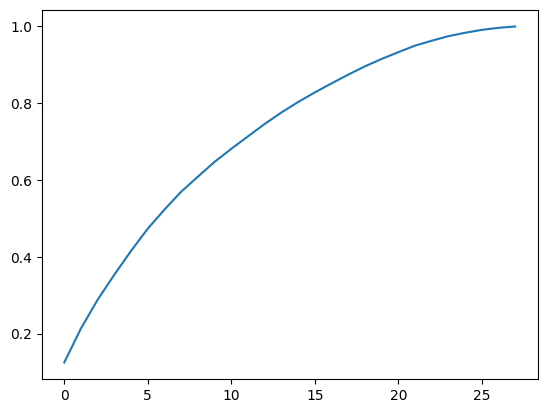

In [12]:
plt.plot(cumsum)

In [13]:
"""
pca = PCA(n_components = 154)
X_reduced =  pca.fit_transform(X_train)
X_recovered = pca.inverse_transform(X_reduced)
"""

'\npca = PCA(n_components = 154)\nX_reduced =  pca.fit_transform(X_train)\nX_recovered = pca.inverse_transform(X_reduced)\n'

In [14]:
"""
from sklearn.decomposition import IncrementalPCA

n_batches = 100
inc_pca = IncrementalPCA(n_components= 154)
for X_bath in np.array_split (X_train, n_batches):
    inc_pca.partial_fit(X_bath)

X_reduced = inc_pca.transform(X_train)
"""

'\nfrom sklearn.decomposition import IncrementalPCA\n\nn_batches = 100\ninc_pca = IncrementalPCA(n_components= 154)\nfor X_bath in np.array_split (X_train, n_batches):\n    inc_pca.partial_fit(X_bath)\n\nX_reduced = inc_pca.transform(X_train)\n'

### Kernel PCA code:

In [15]:
"""
from sklearn.decomposition import KernelPCA

rbf_pca = KernelPCA(n_components=2 , kernel= "rbf" , gamma=0.04)
X_reduced = rbf_pca.fit_transform(X)
X_reduced
"""

'\nfrom sklearn.decomposition import KernelPCA\n\nrbf_pca = KernelPCA(n_components=2 , kernel= "rbf" , gamma=0.04)\nX_reduced = rbf_pca.fit_transform(X)\nX_reduced\n'

### Creat a smaller subset to reduce the number of samples

In [16]:
sampled_data = data_import.sample(frac =0.1) #sample the data to reduce the number of parameters 
unused = data_import [["Time", "Amount"]]
y_sampled = sampled_data["Class"]
X_sampled = sampled_data.iloc[: , 1:-2] #all columns except 1st and last 2 columns
X_sampled

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28
129077,1.343347,-1.381134,-0.062120,-1.482645,-1.109275,-0.053426,-0.918299,-0.045972,-1.704629,1.370913,...,-0.313778,-0.172656,-0.189377,-0.369889,-0.118727,-0.790178,0.368267,-0.133405,0.022265,0.025041
154538,2.094767,-0.036615,-2.310538,-0.738220,0.330510,-2.408179,0.997547,-0.913585,1.826422,-0.845352,...,0.338404,-0.175408,0.180409,0.964138,-0.186690,0.542809,0.654647,0.606463,-0.147622,-0.090818
9062,1.227600,0.079066,0.733355,1.099969,-0.607849,-0.562252,-0.259614,-0.152158,1.984567,-0.568295,...,-0.010640,-0.200411,-0.245420,-0.237781,-0.070893,0.378335,0.545347,0.401319,-0.046237,0.003394
6734,0.314597,2.660670,-5.920037,4.522500,-2.315027,-2.278352,-4.684054,1.202270,-0.694696,-5.526278,...,2.177386,0.562706,0.743314,0.064038,0.677842,0.083008,-1.911034,0.322188,0.620867,0.185030
260169,-2.010330,1.193601,0.040123,0.271405,-0.503776,-0.687678,-1.624631,-3.818256,1.102585,-0.591613,...,-0.691616,-1.340648,4.106241,-0.052049,0.053474,0.772760,-0.849553,-0.249974,0.211405,-0.372304
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
251776,-0.038612,0.778809,0.360233,-0.667823,0.482931,-0.886220,0.880683,-0.069481,-0.326883,-0.240384,...,0.170293,-0.011288,-0.197694,-0.433272,0.073728,0.074350,-0.525396,0.114639,0.243028,0.089413
219212,2.061221,-0.096389,-1.074237,0.424790,-0.205600,-1.234372,0.141336,-0.299118,0.638136,0.092146,...,0.147102,-0.265845,-0.296066,-0.750027,0.349028,0.028732,-0.321295,0.197535,-0.074918,-0.061226
192039,-0.990895,1.040841,0.412826,-1.157723,-0.205279,0.340589,-0.495396,1.102788,-0.076710,-1.213084,...,0.249214,-0.308071,-0.036245,-0.425156,0.031280,0.196689,-0.155988,-0.301861,-0.359480,-0.123229
101414,1.215044,-0.037430,0.222886,-0.066626,-0.324483,-0.538337,-0.042582,-0.132805,-0.179638,0.003222,...,0.321231,0.082430,0.122767,0.356458,-0.163579,0.134864,0.444133,1.110458,-0.084140,-0.004613


In [17]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.decomposition import KernelPCA

grid_search = GridSearchCV


X_small = X_sampled[:5000]
y_small = y_sampled[:5000]


#we can running out of memory because KernelPCA creates a huge kernel matrix.
#Kernel methods don't scale well — use regular PCA, approximate kernels, or subset the data.
 
clf = Pipeline ([
    ("kpca", KernelPCA(n_components=2)),
    ("log_reg", LogisticRegression())
])

param_grid = [{
    "kpca__gamma": np.linspace(0.03, 0.05, 10),
    "kpca__kernel": ["rbf" , "sigmoid"] # we are using 2 types of pca kernels which is rbf and sigmoid
}]

grid_search = grid_search(clf, param_grid, cv = 3)
grid_search.fit(X_small,y_small)

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('kpca', KernelPCA(n_components=2)),
                                       ('log_reg', LogisticRegression())]),
             param_grid=[{'kpca__gamma': array([0.03      , 0.03222222, 0.03444444, 0.03666667, 0.03888889,
       0.04111111, 0.04333333, 0.04555556, 0.04777778, 0.05      ]),
                          'kpca__kernel': ['rbf', 'sigmoid']}])

In [18]:
print(grid_search.best_params_)

{'kpca__gamma': np.float64(0.03), 'kpca__kernel': 'rbf'}


### Unsupervised kPCA

In [19]:
rbf_pca = KernelPCA(n_components=2 , kernel="rbf", gamma= 0.0433, fit_inverse_transform= True) #By setting fit_inverse_transform=True, you enable reconstruction of the original data from the reduced form.

X_reduced = rbf_pca.fit_transform(X_small)

x_preimage = rbf_pca.inverse_transform(X_reduced) 
from sklearn.metrics import mean_squared_error
mean_squared_error(X_small,x_preimage) #This is what you want to minimize

1.119615720365076

### Visualizing multi-dimensional data through PCA

In [20]:
pca = PCA (n_components=3)
X3D = pca.fit_transform(X)
X3D

array([[-1.35980713, -0.07278117,  2.53634674],
       [ 1.19185711,  0.26615071,  0.16648011],
       [-1.35835406, -1.34016307,  1.77320934],
       ...,
       [ 1.91956501, -0.30125385, -3.24963981],
       [-0.24044005,  0.53048251,  0.70251023],
       [-0.53341252, -0.18973334,  0.70333737]])

In [29]:
pca_plot_data = pd.DataFrame(X3D) #create new dataframe with the data in the PCA-reduced NumPy array X3D
pca_plot_data["Class"] = y #Adds a new column "Class" to the DataFrame, which contains the labels y (what you're trying to predict).
#pca_plot_data = pca_plot_data.sample(10000) #without the sampling the notebook is significantly larger
pca_plot_data

,0,1,2,Class
0,-1.359807,-0.072781,2.536347,0
1,1.191857,0.266151,0.166480,0
2,-1.358354,-1.340163,1.773209,0
3,-0.966272,-0.185226,1.792993,0
4,-1.158233,0.877737,1.548718,0
...,...,...,...,...
284802,-11.881118,10.071785,-9.834783,0
284803,-0.732789,-0.055080,2.035030,0
284804,1.919565,-0.301254,-3.249640,0
284805,-0.240440,0.530483,0.702510,0


In [22]:
#pip install --upgrade nbformat


In [23]:
#pip install --upgrade pip

In [36]:
import plotly_express as px

fig = px.scatter_3d(pca_plot_data, x=0, y=1, z = 2 , color= 'Class')
fig.show()

In [25]:
pca_plot_data_fraud = pca_plot_data[pca_plot_data["Class"] == 1 ]
pca_plot_data_fraud

,0,1,2,Class
79835,0.340391,2.015233,-2.777330,1
263080,2.132386,0.705608,-3.530759,1
143336,-6.713407,3.921104,-9.746678,1
95534,1.193916,-0.571085,0.742522,1
74794,-6.003422,-3.930731,-0.007045,1
82400,-7.626924,-6.976420,-2.077911,1
153835,-22.341889,15.536133,-22.865228,1
40085,1.083693,1.179501,-1.346150,1
157585,1.934946,0.650678,-0.286957,1
281144,-3.113832,0.585864,-5.399730,1


In [37]:
fig_fraud = px.scatter_3d(pca_plot_data_fraud, x=0, y=1, z = 2 , color= 'Class')
fig_fraud.show()

In [41]:
pca_plot_data_not_fraud = pca_plot_data[pca_plot_data["Class"] == 0 ]
pca_plot_data_not_fraud

,0,1,2,Class
0,-1.359807,-0.072781,2.536347,0
1,1.191857,0.266151,0.166480,0
2,-1.358354,-1.340163,1.773209,0
3,-0.966272,-0.185226,1.792993,0
4,-1.158233,0.877737,1.548718,0
...,...,...,...,...
284802,-11.881118,10.071785,-9.834783,0
284803,-0.732789,-0.055080,2.035030,0
284804,1.919565,-0.301254,-3.249640,0
284805,-0.240440,0.530483,0.702510,0


In [42]:
fig_not_fraud = px.scatter_3d(pca_plot_data_not_fraud, x=0, y=1, z = 2 , color= 'Class')
fig_not_fraud.show()